In [166]:
import warnings
warnings.filterwarnings('ignore')

# UC Parks

> ***/!\ Disclaimer: this work is based and use our own Python package ```geodecision```***
> We present our library in this use case: 
> * how to use different modules 
> * how to combine them 
> * which data to use 

> ***We plot our examples with matplotlib to get valid static outputs. For our dynamic and interactiv dashboard, we will create a [Bokeh application](https://docs.bokeh.org/en/latest/index.html)***

## What we want to do 

We want to create decision-making dashboard tools on the *UC Parks (Use Case Parks)*
Briefly, we want to:
* determine buildings and urban areas located within a 10 minutes walkable range around park and those that are out this accessible area:
    * we need to get parks (*as geolocated polygons or multipolygons*) on our study area
    * we need a graph from the network
    * build accessibility measure tools (*in Python*)
* get "*flat roofs*" of our study area:
    * get CityGML files & parse them to gather informations and make measures
    * select roof with a "*potential*"
* get information from:
    * socio-economic data
    * real estate costs
    * ...

We do this on the following study areas:
* Lyon (*France*)
* Villeurbanne (*France*)

> ***/!\ We set the path to import our own local package***

In [1]:
import os
import sys
geodecision_path = os.path.abspath("../../")

if geodecision_path not in sys.path:
    sys.path.insert(0, geodecision_path)


## Parks
Get parks from a bounding box and a key/value query. Data come from [OpenStreetMap](https://www.openstreetmap.org/#map=14/50.6315/3.0586). 

[OSM Tile Calculator from Geofabrik](http://tools.geofabrik.de/calc/#type=geofabrik_standard&bbox=4.782751,45.716204,4.922042,45.791933&tab=1&proj=EPSG:4326&places=2) can be used to get the bounding box coordinates. 

Bounding box arguments must be a tuple of coordinates in EPSG 4326 => (SOUTH, WEST, NORTH, EAST). 

The function will return a GeoJSON features collection. 

These features can be:
* transformed into a GeoPandas DataFrame 
* written into a GeoJSON file in order to be available locally 
* be plotted to visually check our request
* check the DataFrame 

In [4]:
import geopandas as gpd

from geodecision import get_OSM_poly

bbox = (45.7,4.82,45.8,4.99)
key = "leisure"
value = "park"

parks = get_OSM_poly(bbox, key, value)

#Check if file exists, delete it if so before writting it (necessary because of Fiona behavior with GeoJSON)
try:
    os.remove("./data/parks.geojson")
except OSError:
    pass

parks.to_file("./data/parks.geojson", driver="GeoJSON")

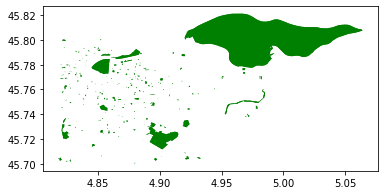

In [5]:
parks.plot(color="green")

### Measure accessibility to parks
### Get a graph
#### Get the street network ...
#### ... & transform it to graph

### Connect parks to the network
In order to measure accessibility to parks, we need to connect them to the street network (*which has been transformed into a graph*).

First, a brief history of our multiple approaches' attempts and their limits.

Here is a brief history of our reflexions and methodolical approaches to connect the parks to the street network.

| Name | Illustration | Details & Limits | Status |
|:-----|:------------:|:---------------:|:------:|
| V1 |<img src="./doc/accessibility/animation/get_nodes_animation.gif" width="75%"> | Slow (*lot of spatial requests*), arbitrary buffer size, problematic with very long edges | *Rejected* |

| Name | Illustration | Details & Limits | Status |
|:-----|:------------:|:---------------:|:------:|
| V2 |<img src="./doc/accessibility/animation/get_nodes_animation_V2.gif" width="75%"> | Generates a lot of points, must be adapted regarding the size of the park | *Rejected* |

| Name | Illustration | Details & Limits | Status |
|:-----|:------------:|:---------------:|:------:|
| V3 | <img src="./doc/accessibility/animation/get_nodes_animation_V3.gif" width="75%"> | Better than the previous solution but may generate unnecessary nodes and edges | *Rejected* |

| Name | Illustration | Details & Limits | Status |
|:-----|:------------:|:---------------:|:------:|
| V4 | <img src="./doc/accessibility/animation/get_nodes_animation_V4.gif" width="75%"> | Demands a more complicated implementation but is more efficient and precise | *Adopted* |

#### Illustration 

![isolines](./doc/accessibility/accessibility_isolines.png)

## Roofs potential 
Roofs data come from CityGML data, because we can't find this kind of data in the OSM data.

We can apply our Python functions to get roofs and measure: 
* slopes,
* compactness,
* minimal width

We parse the local directory with GML files and create GeoJSON files and one GeoJSON file that is a merge of all GeoJSON files. 

We also try to get available denomination of buildings. 

### Get CityGML 
> ***Data can be found on [Grand Lyon open data](https://data.beta.grandlyon.com/fr/jeux-de-donnees/maquettes-3d-texturees-a-commune-arrondissement-2009-2012-2015-metropole-lyon/info)*** 

#### Parse GML files, get roofs and buildings

In [1]:
import os
import sys
geodecision_path = os.path.abspath("../../")

if geodecision_path not in sys.path:
    sys.path.insert(0, geodecision_path)

In [2]:
import json

from geodecision import GetRoofsAndSlopes

#Inputs
epsg_in = 3946
epsg_out = 3946
gml_dir = "./data/city_gml/gml/"
output_dir = "./data/city_gml/GPKG/"
palette = "viridis"
driver  = "GPKG"
attributes = [
    "ADMINISTRA",
    "CULTE", 
    "DEPLACEMEN",
    "ENSEIGNEME",
    "SANTE",
    "SPORT",
    "URGENCE"
]
tuples = []
dfs = []
gdfs = []
dfs_buildings = []

#Get a list of tuples gml_file_name, shapefiles name
for gml_file in os.listdir(gml_dir):
    if gml_file.endswith(".gml"):
        name = os.path.splitext(gml_file)[0]
        name_gml = os.path.join(gml_dir, name + ".gml")
        tuples.append((name_gml, name, output_dir))
    break
        
#Get flat roofs gpkg for each Lyon districts and for Villeurbanne
for tuple_ in tuples:
    roofs = GetRoofsAndSlopes(
        tuple_[0], 
        epsg_in, 
        epsg_out,
        tuple_[1], 
        attributes = attributes,
        driver = driver, 
        out_dir = tuple_[2] 
    )
    dfs.append(roofs.df_roofs)
    gdfs.append(roofs.gdf_roofs)
    dfs_buildings.append(roofs.df_buildings)


Value for espg_in: 3946
Value for epsg_out: 3946

                            RoofSurface with id UUID_c8cd4fd2-d285-4c00-ad33-b433c3e772ef has problematic posList at position 2: 
                            1844836.70559789 5172703.73228037 189.23958061 1844836.70560286 5172703.73227812 189.23958061 
                            Angle of this will be 360 (in degrees) to highlight the problem
                            

                            RoofSurface with id UUID_c8cd4fd2-d285-4c00-ad33-b433c3e772ef has problematic posList at position 7: 
                            1844847.26491699 5172699.21013961 189.28300634 1844847.26491968 5172699.21013847 189.28300635 
                            Angle of this will be 360 (in degrees) to highlight the problem
                            

                            RoofSurface with id UUID_408d054e-91c2-4f33-9865-f59d4c2dff52 has problematic posList at position 1: 
                            1845020.28752417 5173626.60416129 183.7560

In [3]:
accessibles = roofs.df_buildings.loc[
                            roofs.df_buildings["public_access"]==True
                        ]

public_access = """
                Number of buildings:                              {}
                Number of theoretically accessible buildings :    {}
                % of accessible buildings:                        {} %
                """.format(
                    len(roofs.df_buildings),
                    len(accessibles),
                    int(
                        round(
                            (len(accessibles) / len(roofs.df_buildings))*100
                        )
                    )
                )

In [4]:
print(public_access)


                Number of buildings:                              3505
                Number of theoretically accessible buildings :    77
                % of accessible buildings:                        2 %
                


In [3]:
from bokeh.models import ColumnDataSource, GeoJSONDataSource
from bokeh.palettes import Viridis11
from bokeh.transform import factor_cmap
from bokeh.plotting import figure, output_notebook, show
from bokeh.tile_providers import get_provider, Vendors
from bokeh.models.widgets import RangeSlider
from bokeh.layouts import row, widgetbox
import json
import numpy as np

from geodecision import gdf_to_geosource, make_sliders, get_hist_source

output_notebook()

#Tiles
tile_provider = get_provider(Vendors.STAMEN_TERRAIN)

#Source for map
# Reprojection to fit with Bokeh tiles
gdf = roofs.gdf_roofs.to_crs(epsg=3857)

## Transform to GeoJSONDataSource
geo_source = GeoJSONDataSource(geojson=gdf_to_geosource(gdf))

#Set the sliders
values = [
    "angles", 
    "heights", 
    "area", 
    "total_surface", 
    "min_width", 
    "compactness"
]

samples = 100
sliders = make_sliders(gdf, values, samples=samples)

    
#Source for histogram
group = "NOMCOMMUNE"

hist_source = ColumnDataSource(data=get_hist_source(gdf, group)) 


p = figure(
    x_range=hist_source.data["groups"], 
    plot_height=350, 
    toolbar_location=None, 
    title="Sums by place"
)

p.vbar(x="groups", 
       top="sums", 
       width=0.9, 
       source=hist_source, 
       legend_field="sums",
       line_color='white', 
       fill_color=factor_cmap(
           "groups", 
           palette=Viridis11, 
           factors=hist_source.data["groups"]
       )
      )

p.xgrid.grid_line_color = None
p.legend.orientation = "horizontal"
p.legend.location = "top_center"


#Update functions
def update(attrname, old, new):
    for k,v in sliders.items():
        gdf = gdf.loc[gdf[]]
    update = json.loads(
        gdf.loc[
            gdf["total_seconds"] == slider_schedule.value
        ].to_json()
    )

layout = row(
    p,
    widgetbox(
        [x for x in sliders.values()]
    )
)

show(layout)

# #Figure
# p = figure(
# title="Map",
# output_backend="webgl"
# # plot_height=plot_height,
# # plot_width=plot_width,
# # x_range = x_range,
# # y_range = y_range
# )

# #Add tile
# p.add_tile(tile_provider)

# #Add patches
# p.patches('xs', 'ys', color='blue', alpha=0.5, source=geo_source)
# show(p)

Loading BokehJS ...

/home/thomas/anaconda3/envs/geodecision/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


In [7]:
for k,v in sliders.items():
    start = v.value[0]
    end = v.value[1]
    print (k, start, end)

angles 0.0 144.6406856447787
heights 0.0 73.253
area 6.742051962262087e-06 5092.30872895825
total_surface 0.0 35646.16110270775
min_width 7.549409143268593e-05 105.22377606718949
compactness 0.020992883721361155 1.4812998020544268


#### Write results and measure % of valid attributes
* Write results and concatenated files (*for roofs and for buildings*)
* Measure the % of valid attributes

***WARNING: attributes can be problematic => https://github.com/VCityTeam/UD-SV/tree/master/UD-Doc/LessonsLearned/WorkingWithLyonOpenData#undocummented-additional-data-***

***Average level height => 2.70 (source: https://www.lemoniteur.fr/article/les-sept-principes-a-s-approprier.1953879)***

***WARNING: we don't have possibility to distinguish commercial/office buildings from apartment blocks, yet they have not the same average height for level***

In [4]:
import geopandas as gpd

roofs = gpd.pd.concat(gdfs)
buildings = gpd.pd.concat(dfs_buildings)
name = "./data/city_gml/geojson/roofs.geojson"

#Check if file exists, delete it if so before writting it 
##(necessary because of Fiona behavior with GeoJSON)
try:
    os.remove(name)
except OSError:
    pass

roofs.to_file(
    name, 
    driver="GeoJSON",
    encoding="utf-8"
)

with open("./data/city_gml/geojson/buildings.json", 'w', encoding='utf-8') as f:
    json.dump(
        buildings.to_json(orient="index"), 
        f, 
        ensure_ascii=False, 
        indent=4
    )
    
valid_attr = """
                Length of Buildings DataFrame: {} elements
                Number of valid attributes:    {}
                % of valid attributes:         {} %
                """.format(
                    len(buildings),
                    len(set(buildings["attribute"])),
                    int(
                        round(
                            (len(set(buildings["attribute"])) / len(buildings))*100
                        )
                    )
                )

In [5]:
print (valid_attr)


                Length of Buildings DataFrame: 3505 elements
                Number of valid attributes:    68
                % of valid attributes:         2 %
                


In [4]:
t = gdf.loc[gdf["angles"] >= 0.0 & gdf["angles"] < 144.6406856447787]

NameError: name 'gdf' is not defined

In [9]:
with open("/home/thomas/Bureau/Temp/test_md_pandas.md","w") as f:
    f.write(t["attribute"].to_markdown())

***/!\ Poor information on buildings attributes. Need to try to find information elsewhere***

#### Plot roofs: find all roofs with potential
We can filter and select roofs to get only roofs with *potential* for the development of park. 

Such a roof requires:
* a minimum width 
* a minimum area 
* a maximum slope
* [a certain compactness](https://fisherzachary.github.io/public/r-output.html) (***TODO: THIS POINT NEEDS TO BE DOCUMENTED***)

##### Width

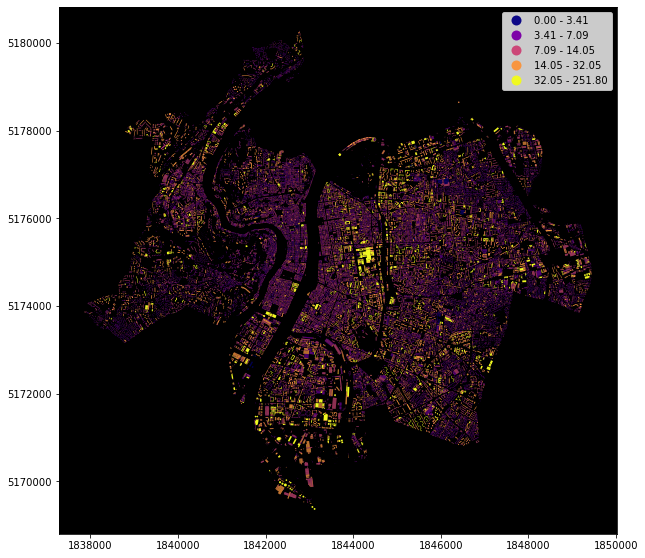

In [136]:
f, ax = plt.subplots(figsize=(10, 10))
roofs.plot(ax=ax, column='min_width', scheme='natural_breaks', legend=True, cmap='plasma')
ax.set_facecolor("black")

##### Area

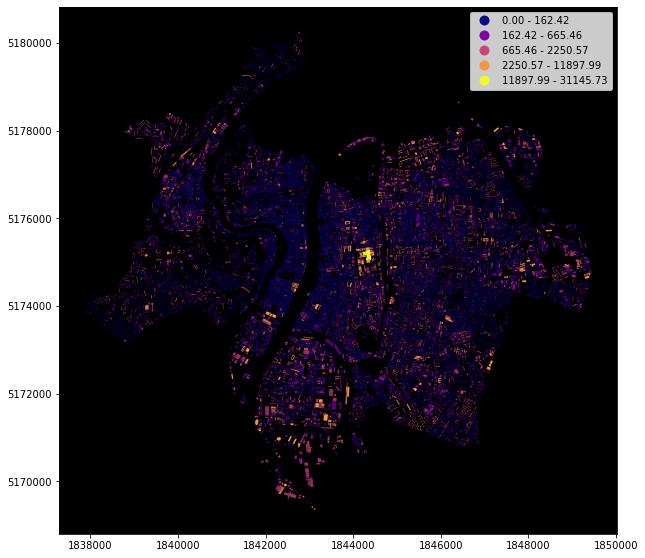

In [137]:
f, ax = plt.subplots(figsize=(10, 10))
roofs.plot(ax=ax, column='area', scheme='natural_breaks', legend=True, cmap='plasma')
ax.set_facecolor("black")

##### Slope

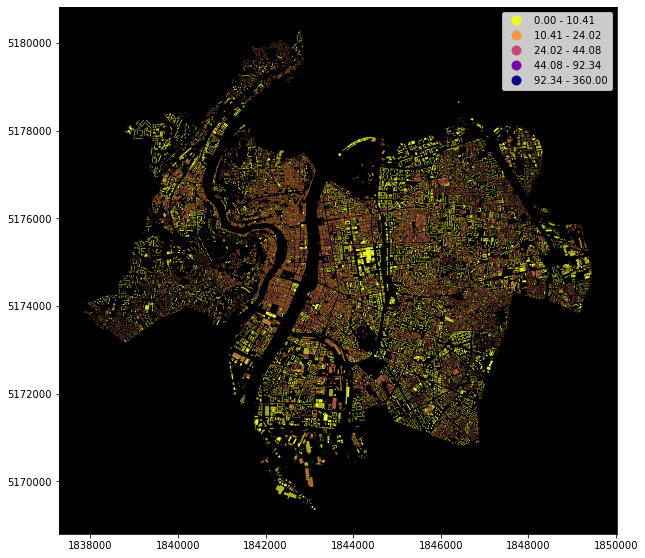

In [138]:
f, ax = plt.subplots(figsize=(10, 10))
roofs.plot(ax=ax, column='angles', scheme='natural_breaks', legend=True, cmap='plasma_r')
ax.set_facecolor("black")

##### Compactness

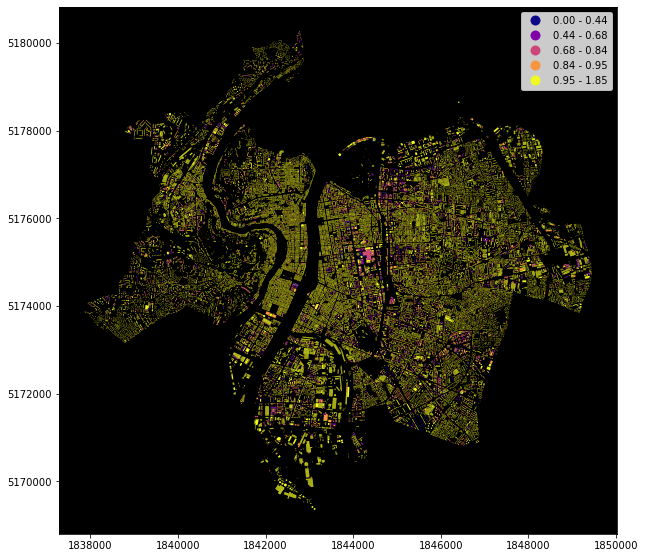

In [139]:
f, ax = plt.subplots(figsize=(10, 10))
roofs.plot(ax=ax, column='compactness', scheme='natural_breaks', legend=True, cmap='plasma')
ax.set_facecolor("black")

We discrimises with (***we need to work on these points to justify our choices***):

| parameter | value |
|:----------|:------|
| minimum width (*meters*) | 10 |
| minimum compactness | 0.7 |
| minimum area (*m²*) | 100 |
| maximum slope (*angle*) | 30 |

In [163]:
#Make selections
selection = roofs.loc[
    (roofs["min_width"] >= 10)
    & (roofs["compactness"] >= 0.7)
    & (roofs["area"] >= 100)
    & (roofs["angles"] <= 30)
]

#Check if file exists, delete it if so before writting it 
##(necessary because of Fiona behavior with GeoJSON)
try:
    os.remove("./data/city_gml/geojson/selection.geojson")
except OSError:
    pass

selection.to_file(
    "./data/city_gml/geojson/selection.geojson",
    driver="GeoJSON",
    encoding="utf-8"
)

nb_roofs = len(roofs)

roofs_potential = """
                    % of roofs with min. width >= 10 m  =>  {} %
                    % of roofs with compactness >= 0.7  =>  {} %
                    % of roofs with area >= 100 m²      =>  {} %
                    % of roofs with slope <= 30°        =>  {} %
                    
                    Number of roofs with potential      =>  {}
                    Total number of roofs (study area)  =>  {}
                    % of roofs with potential           =>  {} %
                    
                    Total roofs area (m²)               =>  {}
                    Roofs area with potential (m²)      =>  {}
                    % of potential roofs area           =>  {} %
                    """.format(
                        round(len(roofs.loc[(roofs["min_width"] >= 10)]) / nb_roofs * 100),
                        round(len(roofs.loc[(roofs["compactness"] >= 0.7)]) / nb_roofs * 100),
                        round(len(roofs.loc[(roofs["area"] >= 100)]) / nb_roofs * 100),
                        round(len(roofs.loc[(roofs["angles"] <= 30)]) / nb_roofs * 100),
                        len(selection),
                        len(roofs),
                        round(
                                (len(selection) / len(roofs))*100
                            ),
                        roofs.area.sum(),
                        selection.area.sum(),
                        round(
                            (selection.area.sum() / roofs.area.sum())*100
                        )
                    )

In [164]:
print(roofs_potential)


                    % of roofs with min. width >= 10 m  =>  7 %
                    % of roofs with compactness >= 0.7  =>  98 %
                    % of roofs with area >= 100 m²      =>  10 %
                    % of roofs with slope <= 30°        =>  86 %
                    
                    Number of roofs with potential      =>  15512
                    Total number of roofs (study area)  =>  330945
                    % of roofs with potential           =>  5 %
                    
                    Total roofs area (m²)               =>  15725334.177007195
                    Roofs area with potential (m²)      =>  5717577.128122902
                    % of potential roofs area           =>  36.0 %
                    


In [ ]:
###### ax = roofs.plot(color="white", label="Roofs",figsize=(10,10))
ax.set_facecolor("black")
selection.plot(color="green", label="Potential roofs", ax=ax)
iso_10_mn = gpd.read_file("./data/iso_cut.gpkg", layer="iso_10", driver="GPKG")
iso_10_mn_3946 = iso_10_mn.to_crs(epsg=3946)
iso_10_mn_3946.plot(ax=ax, color="white", alpha=0.4)
plt.plot()

## Urban analysis: buildings
We get the buildings from OpenStreetMap by using the [```osmnx``` Python library](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.footprints.footprints_from_polygon). 

Data need to be cleaned (*get rid of non-valid/empty geometries*)

Once this done, we will use the analyse's capabilities of the [momepy](http://guide.momepy.org/) Python library.

For a first analyse, we will use the [momepy examples section](https://guide.momepy.org/weights/examples.html)

### Get buildings 

In [60]:
import geopandas as gpd
import osmnx as ox
from shapely.geometry import Polygon, MultiPolygon

study_area = gpd.read_file("./data/study_field.geojson").to_crs(epsg=4326)
bldgs_osm = ox.footprints.footprints_from_polygon(
    study_area["geometry"][0]
)

#Keep only a few columns
bldgs_osm = bldgs_osm[["name", "geometry"]]

#Delete non valid geometries
bldgs_osm["valid"] = bldgs_osm["geometry"].is_valid
bldgs_osm = bldgs_osm.loc[bldgs_osm["valid"] == True]
bldgs_osm["empty"] = bldgs_osm["geometry"].is_empty
bldgs_osm = bldgs_osm.loc[bldgs_osm["empty"] == False]

#Drop useless "valid" column
bldgs_osm.drop(["valid","empty"], inplace=True, axis=1)
bldgs_osm.to_file("./data/buildings_osm.gpkg", layer="buildings", driver="GPKG")


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


### Prepare data

> ***/!\ Next operations with ```momepy``` will take time regarding the number of buildings.***:

> => ***Read [tessellation part in momepy user guide](https://guide.momepy.org/elements/tessellation) to know how to set parameters and balance precision/memory usage***

#### Preprocess buildings

In [65]:
import momepy

bldgs_osm = gpd.read_file("./data/buildings_osm.gpkg", layer="buildings")
bldgs_osm_projected = ox.project_gdf(bldgs_osm) #seems to be needed to avoid errors in tessallation part (see doc)
bldgs = momepy.preprocess(
    bldgs_osm_projected, 
    size=30,
    compactness=True, 
    islands=True
)

/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


Loop 1 out of 2.


Changing geometry: 100%|██████████| 15227/15227 [12:17<00:00, 20.65it/s]


Loop 2 out of 2.


Changing geometry: 100%|██████████| 923/923 [00:32<00:00, 28.36it/s]


In [66]:
#Save this first step 
bldgs.to_file("./data/buildings_osm.gpkg", layer="buildings_momepy", driver="GPKG")

#### Make tessellation 
> ***/!\ WARNING: WE ADD A TRY/EXCEPT in ```momepy.distribution.py``` at line 553 in NeighborDistance to avoid errors on MultiPolygons***

In [2]:
import geopandas as gpd
import momepy 

bldgs = gpd.read_file("./data/buildings_osm.gpkg", layer="buildings_momepy")
bldgs['uID'] = momepy.unique_id(bldgs)
limit = momepy.buffered_limit(bldgs)
tessellation = momepy.Tessellation(
    bldgs, 
    unique_id='uID', 
    limit=limit
).tessellation

Inward offset...
Discretization...


  0%|          | 14/60285 [00:00<07:10, 139.94it/s]

Generating input point array...


100%|██████████| 60285/60285 [01:18<00:00, 766.94it/s] 


Generating Voronoi diagram...
Generating GeoDataFrame...


Vertices to Polygons: 100%|██████████| 8587496/8587496 [02:44<00:00, 52114.51it/s]


Dissolving Voronoi polygons...
Preparing limit for edge resolving...
Building R-tree...


  3%|▎         | 46/1645 [00:00<00:03, 452.26it/s]

Identifying edge cells...


  1%|          | 17/1660 [00:00<00:09, 165.19it/s]

Cutting...


100%|██████████| 1660/1660 [00:09<00:00, 174.84it/s]
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/momepy/elements.py:424: UserWarning: Tessellation does not fully match buildings. 1 element(s) collapsed during generation - unique_id: {57688}
  "during generation - unique_id: {i}".format(len=len(diff), i=diff)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/momepy/elements.py:434: UserWarning: Tessellation contains MultiPolygon elements. Initial objects should be edited. unique_id of affected elements: [18549, 23745, 23862, 27326, 27938, 30778, 39740, 44778, 51021, 51645, 55799, 56419, 56887, 57246, 57325, 57332, 57333, 58512, 58629, 58970, 59236, 59993]
  "unique_id of affected elements: {}".format(list(uids))


In [102]:
#Save tessellation
bldgs.to_file("./data/buildings_osm.gpkg", layer="tessellation", driver="GPKG")

### Analysis 
#### Distance to neighbours 
"*To calculate the mean distance to neighbouring buildings, we need queen contiguity weights of the first order capturing the relationship between immediate neighbours. Relationship between buildings is here represented by relationships between their tessellation cells*" [momepy weights examples](https://guide.momepy.org/weights/examples.html#Distance-to-neighbours)

In [18]:
import geopandas as gpd
import momepy 

tessellation = gpd.read_file("./data/buildings_osm.gpkg", layer="tessellation")
bldgs = gpd.read_file("./data/buildings_osm.gpkg", layer="buildings_momepy")
bldgs['uID'] = momepy.unique_id(bldgs)

sw1 = momepy.sw_high(k=1, gdf=tessellation, ids='uID')
bldgs['neighbour_dist'] = momepy.NeighborDistance(bldgs, sw1, 'uID').series
bldgs.to_file("./data/buildings_osm.gpkg", layer="buildings_momepy", driver="GPKG")

100%|██████████| 60022/60022 [01:13<00:00, 813.49it/s]


In [98]:
iso_10_mn_32631 = iso_10_mn.to_crs(epsg=32631)

/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


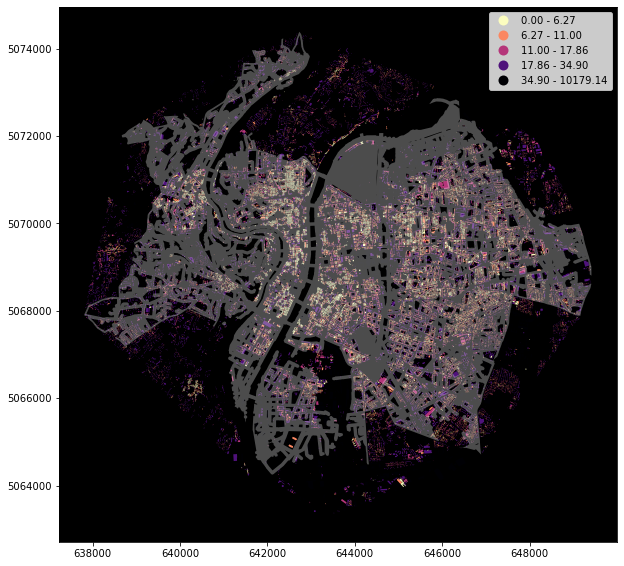

In [102]:
import matplotlib.pyplot as plt
bldgs = bldgs.dropna(subset=["neighbour_dist"])
f, ax = plt.subplots(figsize=(10, 10))
bldgs.plot(ax=ax, column='neighbour_dist', scheme='quantiles', legend=True, cmap='magma_r')
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.3, legend=True)
ax.set_facecolor("black")

In [71]:
total = len(bldgs)
nbs = {}
step = 5
string = """
         Total number of buildings                                   =>  {}
         """.format(total)

for i in range(0,step*10,step):
    nb = len(
        bldgs.loc[
            (bldgs["neighbour_dist"] > i) &
            (bldgs["neighbour_dist"] <= i+step)
        ]
    )
    nbs[(i,i+step)] = nb
    tmp = """
          % of buildings with a neighbour distance  {}m <= x < {}m      =>  {} %
          """.format(
        i, 
        i+step,
        round(nb/total*100)
    )
    string += tmp

remaining = len(
        bldgs.loc[
            (bldgs["neighbour_dist"] > i+step) &
            (bldgs["neighbour_dist"] <= bldgs["neighbour_dist"].max())
        ]
    )

sub_tot = len(
        bldgs.loc[
            (bldgs["neighbour_dist"] > 0) &
            (bldgs["neighbour_dist"] <= i+step)
        ]
    )

string_ = """
          Total of classified  => {} %
          Remaining            => {} %
          """.format(
    round(sub_tot/total*100),
    round(remaining/total*100)
)

In [72]:
print(string)


         Total number of buildings                                   =>  60020
         
          % of buildings with a neighbour distance  0m <= x < 5m      =>  13 %
          
          % of buildings with a neighbour distance  5m <= x < 10m      =>  21 %
          
          % of buildings with a neighbour distance  10m <= x < 15m      =>  17 %
          
          % of buildings with a neighbour distance  15m <= x < 20m      =>  11 %
          
          % of buildings with a neighbour distance  20m <= x < 25m      =>  7 %
          
          % of buildings with a neighbour distance  25m <= x < 30m      =>  5 %
          
          % of buildings with a neighbour distance  30m <= x < 35m      =>  3 %
          
          % of buildings with a neighbour distance  35m <= x < 40m      =>  2 %
          
          % of buildings with a neighbour distance  40m <= x < 45m      =>  2 %
          
          % of buildings with a neighbour distance  45m <= x < 50m      =>  1 %
          

In [ ]:
print(string_)

#### [Density](https://guide.momepy.org/weights/examples.html#Density)

In [104]:
sw = momepy.sw_high(
    k=3, 
    gdf=tessellation, 
    ids='uID'
)
bldgs["area"] = momepy.Area(bldgs).series
tessellation = tessellation.merge(
    bldgs[["uID","area"]]
)
coverage = momepy.Density(
    tessellation, 
    values = "area", 
    spatial_weights = sw,
    unique_id = "uID"
)
tessellation["gross_coverage"] = coverage.series

100%|██████████| 60020/60020 [00:47<00:00, 1253.61it/s]


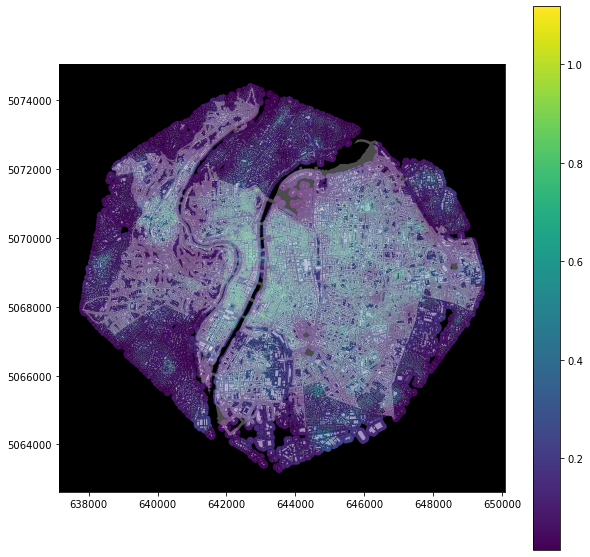

In [105]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, column='gross_coverage', legend=True)
bldgs.plot(ax=ax, color='white', alpha=.5)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.3, legend=True)
ax.set_facecolor("black")

## Urban analysis: street network
In this section, we are going to use OpenStreetMap data and ```osmnx``` as well as ```momepy``` libraries to build a graph from the street network and analyse:
* the local closeness centrality (["*Closeness centrality could be simplified as average distance to every other node from each node*"](https://guide.momepy.org/graph/centrality.html#Closeness-centrality))
* the edge-based betweenness (["*Betweenness centrality measures the importance of each node or edge for the travelling along the network. It measures how many times is each node/edge used if we walk using the shortest paths from each node to every other.*"](https://guide.momepy.org/graph/centrality.html#Betweenness))
* the straightness (["*While both closeness and betweenness are generally used in many applications of network analysis, straightness centrality is specific to street networks as it requires geographical element. It is measured as a ratio between real and Euclidean distance while waking from each node to every other.*"](https://guide.momepy.org/graph/centrality.html#Straightness)

### Get the street network as a graph

In [107]:
import osmnx as ox 

streets_graph = ox.graph_from_place(
    ["Lyon, France","Villeurbanne, France"], 
    network_type="walk"
)
streets_graph = ox.project_graph(streets_graph)
edges = ox.save_load.graph_to_gdfs(
    streets_graph,
    nodes=False, 
    edges=True,
    node_geometry=False, 
    fill_edge_geometry=True
)

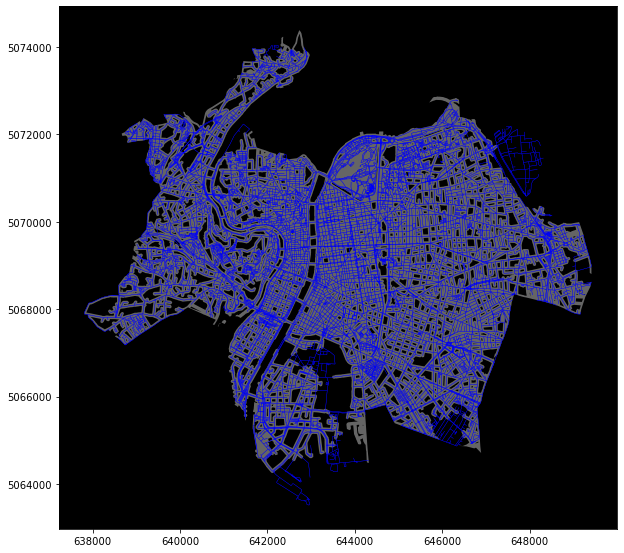

In [112]:
f, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, linewidth=0.3, color="blue")
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
plt.show()

#### Run the measures
> ***WARNING: These measures could take a lot of time***

In [ ]:
primal = momepy.gdf_to_nx(edges, approach="primal")

#Closeness
primal = momepy.local_closeness_centrality(
    primal, 
    radius=400, 
    name='closeness400', 
    distance='mm_len', 
    weight='mm_len'
)

momepy.mean_nodes(
    primal, 'closeness400')

#Betweenness
primal = momepy.betweenness_centrality(
    primal, 
    name='betweenness_metric_e', 
    mode='nodes', 
    weight='mm_len'
)

momepy.mean_nodes(
    primal, 'betweenness_metric_e')

#Straightness
primal = momepy.straightness_centrality(primal)
momepy.mean_nodes(primal, 'straightness')

#### Save GeoDataFrame updated with measures as GPKG

In [166]:
#Transform graph to gdf
nodes, edges, sw = momepy.nx_to_gdf(
    primal, 
    points=True, 
    lines=True,
    spatial_weights=True
)

columns = [
    "u",
    "v",
    "__key",
    "oneway",
    "length",
    "geometry",
    "mm_len",
    "closeness400",
    "straightness",
    "betweenness_metric_e",
    "node_start",
    "node_end"
]

edges_light = edges[columns]

#Write gdf to file
nodes.to_file("./data/graph.gpkg", layer="nodes", driver="GPKG")
edges_light.to_file("./data/graph.gpkg", layer="edges", driver="GPKG")

### Local closeness centrality

In [119]:
edges = gpd.read_file("./data/graph.gpkg", layer="edges", driver="GPKG")

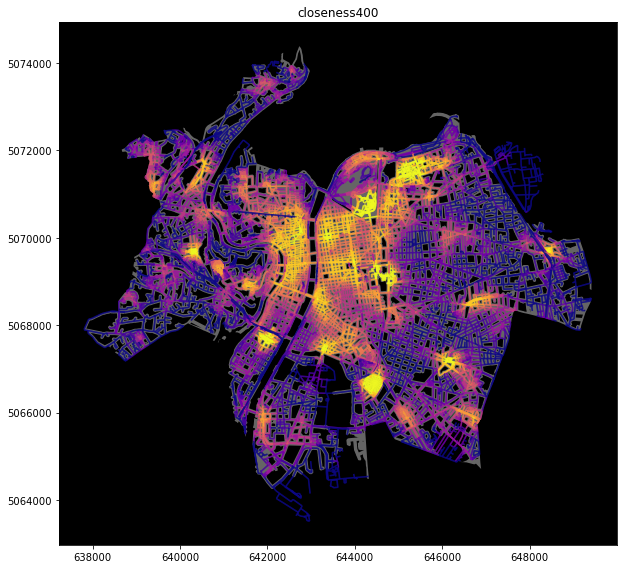

In [120]:
# closeness400 = momepy.nx_to_gdf(primal, points=False)
f, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, column='closeness400', cmap='plasma', scheme='quantiles', k=10, alpha=0.6)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
ax.set_title('closeness400')
plt.show()

### Edge-based betweenness

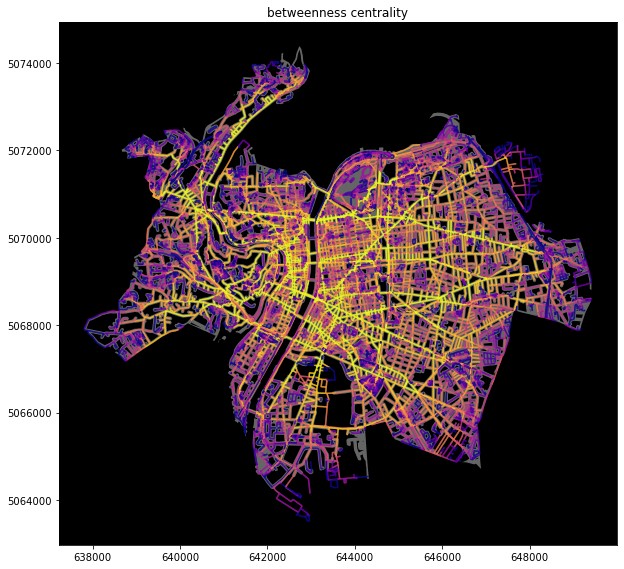

In [121]:
# betweenness = momepy.nx_to_gdf(primal, points=False)
f, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, column='betweenness_metric_e', cmap='plasma', scheme='quantiles', k=10, alpha=0.6)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
ax.set_title('betweenness centrality')
plt.show()

### Straightness

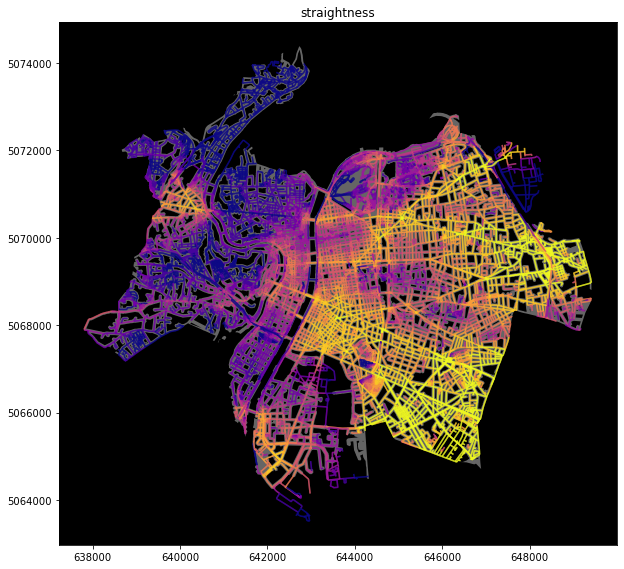

In [122]:
# straightness = momepy.nx_to_gdf(primal, points=False)
f, ax = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax, column='straightness', cmap='plasma', scheme='quantiles', k=10, alpha=0.6)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
ax.set_title('straightness')
plt.show()

## Urban analysis: inequality

We use ```osmnx``` and [```momepy diversity```](https://guide.momepy.org/weights/diversity.html). 

### [Theil index](https://guide.momepy.org/weights/diversity.html#Theil-index) 
> "*The Theil index is a statistic primarily used to measure economic inequality and other economic phenomena, though it has also been used to measure racial segregation*" ([Wikipedia](https://en.wikipedia.org/wiki/Theil_index))

In [123]:
sw3 = momepy.sw_high(
    k=3, 
    gdf=tessellation, 
    ids='uID'
)
area_id_theil = momepy.Theil(
    tessellation, 
    values='area',
    spatial_weights=sw3,
    unique_id='uID',
    rng=(10, 90)
)
tessellation['area_Theil_ID'] = area_id_theil.series

/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/pysal/explore/segregation/network/network.py:16: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  "You need pandana and urbanaccess to work with segregation's network module\n"
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql
100%|██████████| 60020/60020 [01:08<00:00, 874.20it/s]


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:482: UserWarning: Deprecated (2.1.0): Fisher_Jenks is being renamed to FisherJenks. Fisher_Jenks will be removed on 2020-01-31.
  warn(self.message)


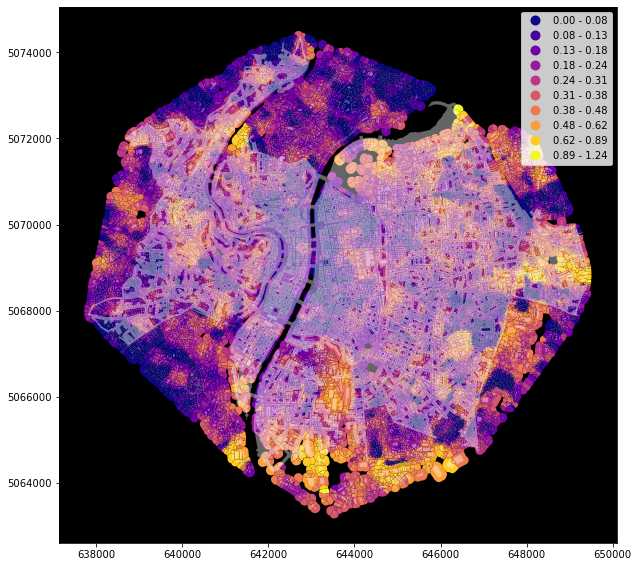

In [124]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, column='area_Theil_ID', scheme='fisherjenkssampled', k=10, legend=True, cmap='plasma')
bldgs.plot(ax=ax, color="white", alpha=0.4)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
plt.show()

### [Simpson's diversity index](https://guide.momepy.org/weights/diversity.html#Simpson's-diversity-index)
> "*The Simpson index was introduced in 1949 by Edward H. Simpson to measure the degree of concentration when individuals are classified into types*" ([Wikipedia](https://en.wikipedia.org/wiki/Diversity_index#Simpson_index))

In [125]:
area_simpson = momepy.Simpson(
    tessellation, 
    values='area',
    spatial_weights=sw3,
    unique_id='uID'
)
tessellation['area_simpson'] = area_simpson.series

/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:86: DeprecationWarning: Call to deprecated function (or staticmethod) headTail_breaks. (use head_tail_breaks)
  return headTail_breaks(values[values >= mean], cuts)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:86: DeprecationWarning: Call to deprecated function (or staticmethod) headTail_breaks. (use head_tail_breaks)
  return headTail_breaks(values[values >= mean], cuts)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:86: DeprecationWarning: Call to deprecated function (or staticmethod) headTail_breaks. (use head_tail_breaks)
  return headTail_breaks(values[values >= mean], cuts)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:86: DeprecationWarning: Call to deprecated function (or staticmethod) headTail_breaks. (use head_tail_breaks)
  return headTail_breaks(values[values 

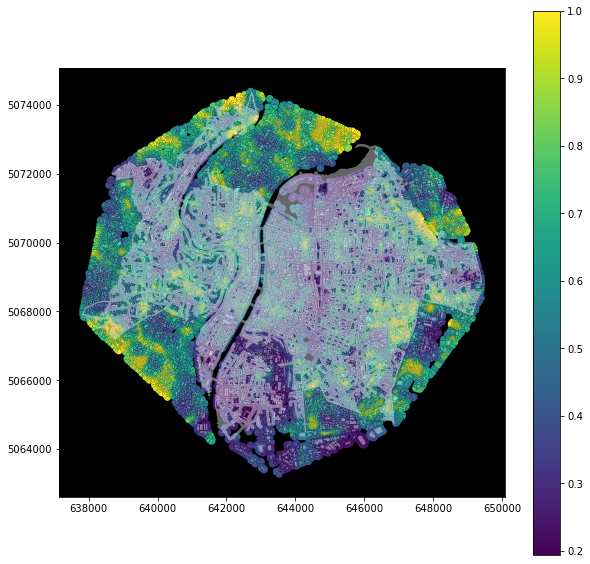

In [126]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, column='area_simpson', legend=True, cmap='viridis')
bldgs.plot(ax=ax, color="white", alpha=0.4)
iso_10_mn_32631.plot(ax=ax, color="white", alpha=0.4, legend=True)
ax.set_facecolor("black")
plt.show()

### Social & economic analysis
> ***INSEE 1km & 200m gridded data***

#### Information
| Name | Provider | License & terms of use | Warnings | Documentation | Variables |
|:-----|:---------|:-----------------------|:---------|:--------------|:----------|
| [Gridded data (*1km*) FiLoSoFi](https://www.insee.fr/fr/statistiques/4176293?sommaire=4176305#consulter-sommaire) | [INSEE](https://www.insee.fr/en/) | [Link](https://statistiques-locales.insee.fr/#c=contact) | [INSEE Warnings (*fr*)](https://statistiques-locales.insee.fr/#c=article) | [Link](https://www.insee.fr/fr/statistiques/4176293?sommaire=4176305#documentation) | [Dictionary of variables](https://www.insee.fr/fr/statistiques/4176293?sommaire=4176305#documentation) |
| [Gridded data (*200m*) FiLoSoFi](https://www.insee.fr/fr/statistiques/4176290?sommaire=4176305#consulter) | [INSEE](https://www.insee.fr/en/) | [Link](https://statistiques-locales.insee.fr/#c=contact) | [INSEE Warnings (*fr*)](https://statistiques-locales.insee.fr/#c=article) | [Link](https://www.insee.fr/fr/statistiques/4176290?sommaire=4176305#documentation) | [Dictionary of variables](https://www.insee.fr/fr/statistiques/4176290?sommaire=4176305#dictionnaire) |

#### [Variables](https://www.insee.fr/fr/statistiques/4176290?sommaire=4176305#dictionnaire)
| Field | Details |
|:------|:--------|
| IdINSPIRE |  Identifiant Inspire du carreau de 200 m |
| I_est_cr | Vaut 1 si le carreau de 200 m est imputé par une valeur approchée, 0 sinon |
| Id_carr_n | Identifiant Inspire du carreau de niveau naturel auquel appartient le carreau de 200 m |
| Groupe | Numéro du groupe auquel appartient le carreau (*voir [documentation](https://www.insee.fr/fr/statistiques/4176290?sommaire=4176305#doc)*) |
| Depcom | Code commune, selon le code officiel géographique 2019, auquel sont rattachés la majorité des ménages du carreau |
| Id_car2010 | Identifiant Inspire du carreau de 200 m figurant dans la base de données carroyées à 200 m diffusée avec la source RFL2010 (*le nombre de caractères peut être différent de celui de IdINSPIRE*) |
| Id_carr1km | Identifiant Inspire du carreau de 1 km auquel appartient le carreau de 200 m |
| I_pauv | Nombre de carreaux de 200 m compris dans le carreau de 1 km qui ont été traités pour respecter la confidentialité sur le nombre de ménages pauvres |
| I_est_1km | Vaut 1 si le carreau est imputé par une valeur approchée, 0 ou 2 sinon |
| Ind | Nombre d’individus |
| Men | Nombre de ménages |
| Men_pauv | Nombre de ménages pauvres |
| Men_1ind | Nombre de ménages d’un seul individu |
| Men_5ind | Nombre de ménages de 5 individus ou plus |
| Men_prop | Nombre de ménages propriétaires |
| Men_fmp | Nombre de ménages monoparentaux |
| Ind_snv | Somme des niveaux de vie winsorisés des individus |
| Men_surf | Somme de la surface des logements du carreau |
| Men_coll | Nombre de ménages en logements collectifs |
| Men_mais | Nombre de ménages en maison |
| Log_av45 | Nombre de logements construits avant 1945 |
| Log_45_70 | Nombre de logements construits entre 1945 et 1969 |
| Log_70_90 | Nombre de logements construits entre 1970 et 1989 |
| Log_ap90 | Nombre de logements construits depuis 1990 |
| Log_inc | Nombre de logements dont la date de construction est inconnue |
| Log_soc | Nombre de logements sociaux |
| Ind_0_3 | Nombre d’individus de 0 à 3 ans |
| Ind_4_5 | Nombre d’individus de 4 à 5 ans |
| Ind_6_10 | Nombre d’individus de 6 à 10 ans |
| Ind_11_17 | Nombre d’individus de 11 à 17 ans |
| Ind_18_24 | Nombre d’individus de 18 à 24 ans |
| Ind_25_39 | Nombre d’individus de 25 à 39 ans |
| Ind_40_54 | Nombre d’individus de 40 à 54 ans |
| Ind_55_64 | Nombre d’individus de 55 à 64 ans |
| Ind_65_79 | Nombre d’individus de 65 à 79 ans |
| Ind_80p | Nombre d’individus de 80 ans ou plus |
| Ind_inc | Nombre d’individus dont l’âge est inconnu |

#### Get the grid for our study area
With [QGIS](https://www.qgis.org/en/site/), we select the part of the gridded data corresponding to our study area and save it as GeoJSON (*to be easily readable by [GeoPandas](http://geopandas.org/) - we'll see this later*).

Then we can use it as a GeoDataFrame. 

#### Make classification 
We have developed a module ```classification``` based on the ```mapclassify``` from Pysal. 

* [References](https://pysal.org/mapclassify/references.html)
* [Automatic classification](https://pysal.org/mapclassify/generated/mapclassify.KClassifiers.html)

This module allows to measure and determine the best classification and make classes for our data. 

This module requires a JSON parameters file as input (*with the structure illustrated below*)

```json
[{
                "name": "name of the futur GeoDataFrame A",
                "filepath": "path/to/GeoJSON file",
                "variables": {
                    "variable 1": {
                        "classification": boolean (if true, make classification, else set to false),
                        "description": "Short description of the var"
                    },
                    "variable 2": {
                        "classification": boolean (if true, make classification, else set to false),
                        "description": "Short description of the var"
                    },
                    "variable 3": {
                        "classification": boolean (if true, make classification, else set to false),
                        "description": "Short description of the var"
                    }
                },
                {
                    "name": "name of the futur GeoDataFrame A",
                    "filepath": "path/to/GeoJSON file",
                    "variables": {
                        "variable 1": {
                            "classification": boolean (if true, make classification, else set to false),
                            "description": "Short description of the var"
                        },
                        "variable 2": {
                            "classification": boolean (if true, make classification, else set to false),
                            "description": "Short description of the var"
                        },
                        "variable 3": {
                            "classification": boolean (if true, make classification, else set to false),
                            "description": "Short description of the var"
                        }
                    }
                }
            ]
```

In [4]:
from geodecision import ClassificationDataFrames

params_insee = "params_insee.json"
classif = ClassificationDataFrames(params_insee)

ELEMENT INSEE_gridded_data_200m
VARIABLE Id_carr1km
VARIABLE Ind
VARIABLE Men
VARIABLE Men_pauv
VARIABLE Men_1ind
VARIABLE Men_5ind
VARIABLE Men_prop
VARIABLE Men_fmp
VARIABLE Ind_snv
VARIABLE Men_surf
VARIABLE Men_coll
VARIABLE Men_mais
VARIABLE Log_av45


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 12
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 13
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 14
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 15
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thom

VARIABLE Log_45_70


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 9
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 10
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 11
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 12
  Warn("Warning: setting k to %d" % k_q, UserWarning)


VARIABLE Log_70_90


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 8
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 9
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 10
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 11
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas

VARIABLE Log_ap90


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 11
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 12
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 13
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 14
  Warn("Warning: setting k to %d" % k_q, UserWarning)


VARIABLE Log_inc
VARIABLE Log_soc


/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:138: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 5
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/anaconda3/envs/space/lib/python3.7/site-packages/mapclassify/classifiers.py:140: UserWarning: Warning: setting k to 6
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/home/thomas/a

VARIABLE Ind_0_3
VARIABLE Ind_4_5
VARIABLE Ind_6_10
VARIABLE Ind_11_17
VARIABLE Ind_18_24
VARIABLE Ind_25_39
VARIABLE Ind_40_54
VARIABLE Ind_55_64
VARIABLE Ind_65_79
VARIABLE Ind_80p


./data/insee/Filosofi_2015_Lyon_Villeurbanne_200m_grid_classified.geojson: No such file or directory
driver GeoJSON does not support creation option ENCODING


VARIABLE Ind_inc
VARIABLE I_pauv
VARIABLE I_est_1km
VARIABLE IdINSPIRE


In [170]:
classif.dict_["INSEE_gridded_data_200m"]

#Save GeoDataFrame with classification 
classif.dict_["INSEE_gridded_data_200m"]["gdf"].to_file(
    "./data/INSEE_gridded_data_200m_classif.gpkg", 
    layer="INSEE_gridded_data_200m", 
    driver="GPKG"
)

In [25]:
import json 

gridded_data_INSEE_200 = gpd.read_file("./data/insee/Filosofi_2015_Lyon_Villeurbanne_200m_grid_classified.geojson")
iso_10_mn = gpd.read_file("./data/iso_cut.gpkg", layer="iso_10", driver="GPKG")

excluded = ["Id_carr1km", "Men_fmp", "Men_surf", "Log_inc", "Ind_inc", "I_pauv", "I_est_1km", "IdINSPIRE"]
with open("params_insee.json") as f:
    params = json.load(f)
variables = params[0]["variables"]

In [13]:
classification = classif.dict_["INSEE_gridded_data_200m"]

In [3]:
def plot_fig(serie, height, width, cmap, major_gdf, second_gdf):
    scheme, k = classification[serie]["best"]["all"].name, classification[serie]["best"]["all"].k
    f, ax = plt.subplots(figsize=(height, width))
    major_gdf.plot(ax=ax, column=serie, scheme=scheme, k=k, legend=True, cmap=cmap)
    second_gdf.plot(ax=ax, color="white", alpha=0.5)
    ax.set_facecolor("black")
    ax.set_title(variables[serie]["description"].upper()+" ["+scheme+", k: "+str(k)+"]")
    plt.show()

In [128]:
height,width = 10,10
cmap = "plasma"
major_gdf = gridded_data_INSEE_200
second_gdf = iso_10_mn

In [4]:
serie = "Ind"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

NameError: name 'height' is not defined

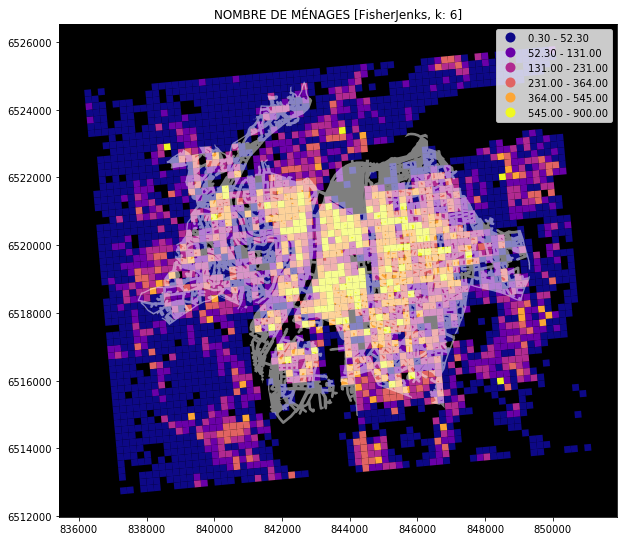

In [56]:
serie = "Men"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

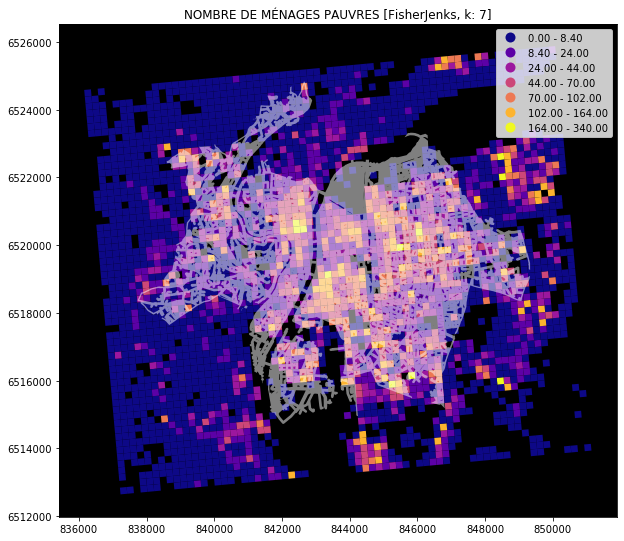

In [57]:
serie = "Men_pauv"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

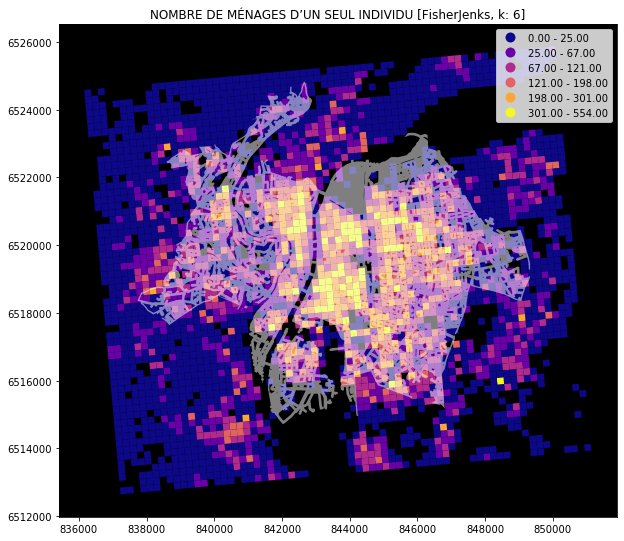

In [58]:
serie = "Men_1ind"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

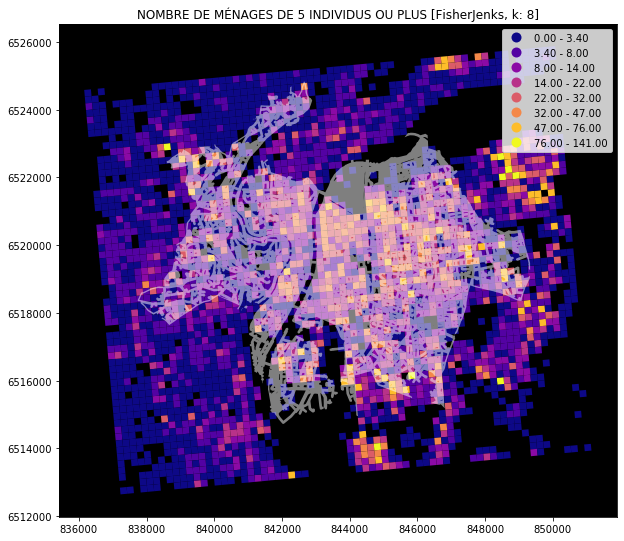

In [59]:
serie = "Men_5ind"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

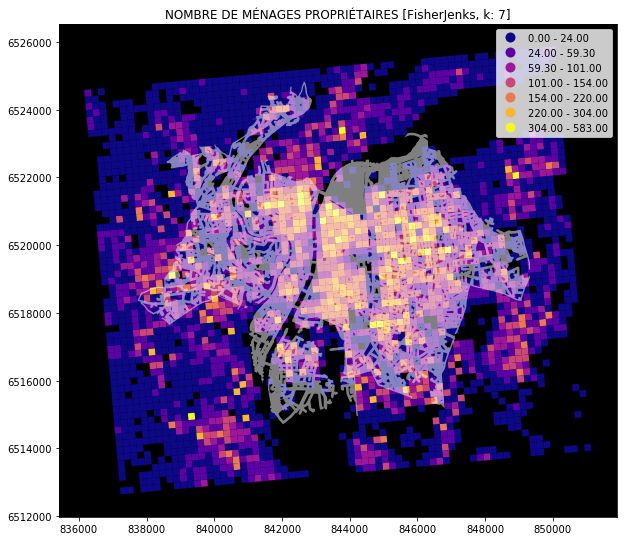

In [60]:
serie = "Men_prop"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

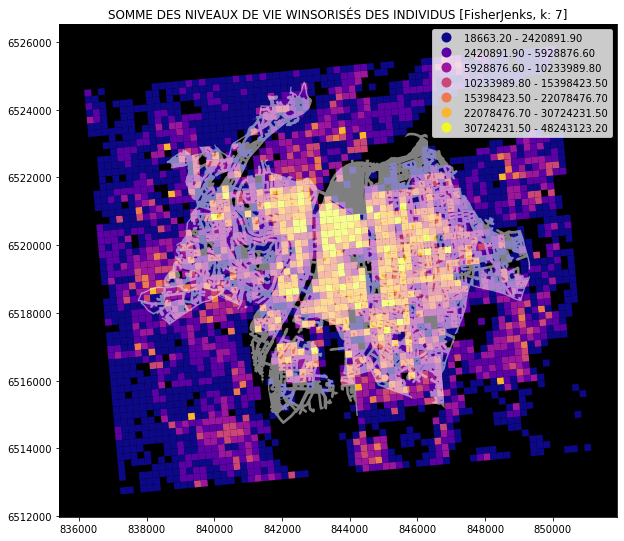

In [61]:
serie = "Ind_snv"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

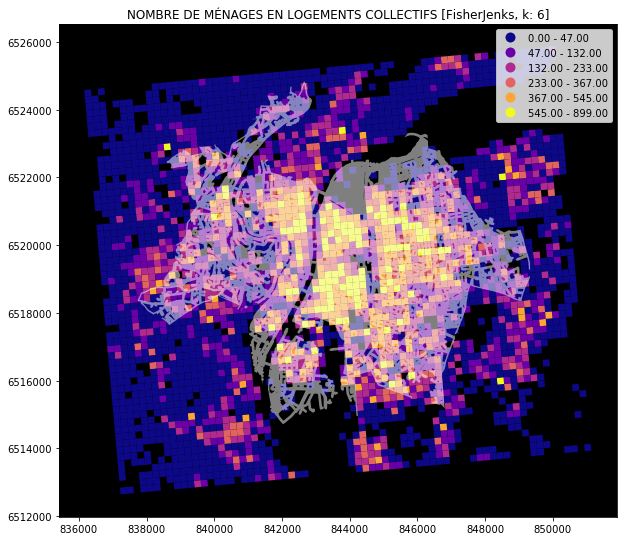

In [62]:
serie = "Men_coll"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

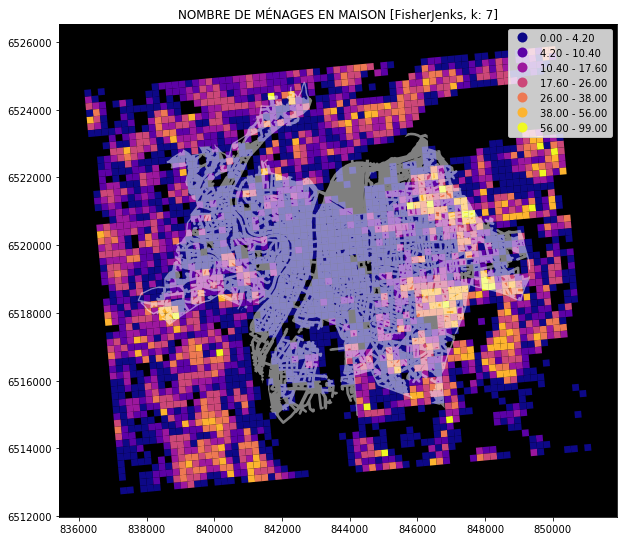

In [63]:
serie = "Men_mais"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

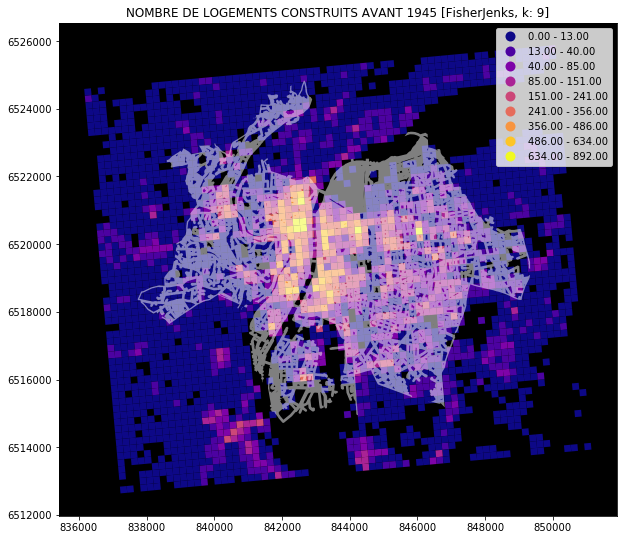

In [64]:
serie = "Log_av45"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

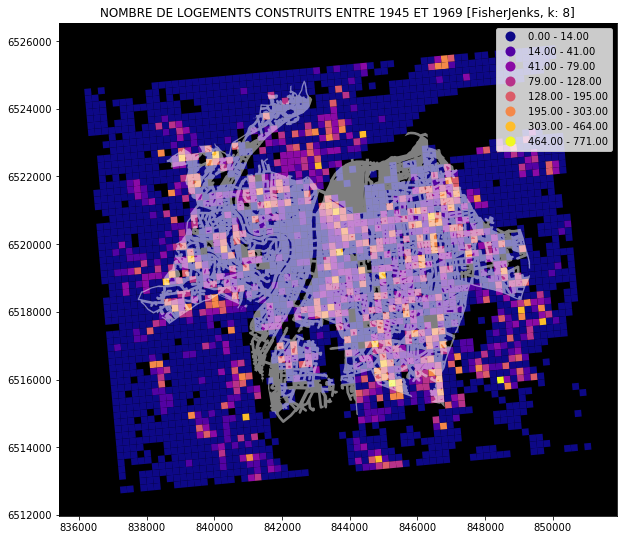

In [65]:
serie = "Log_45_70"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

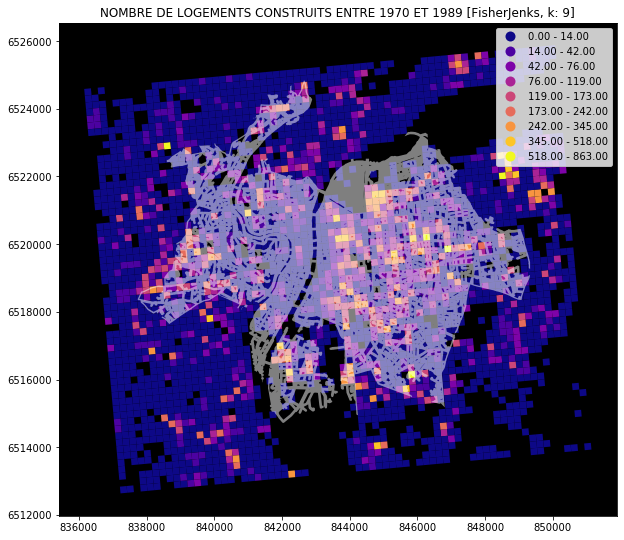

In [66]:
serie = "Log_70_90"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

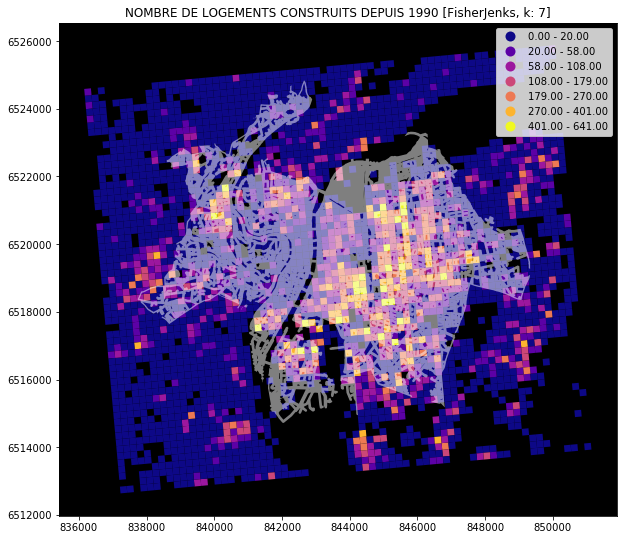

In [67]:
serie = "Log_ap90"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

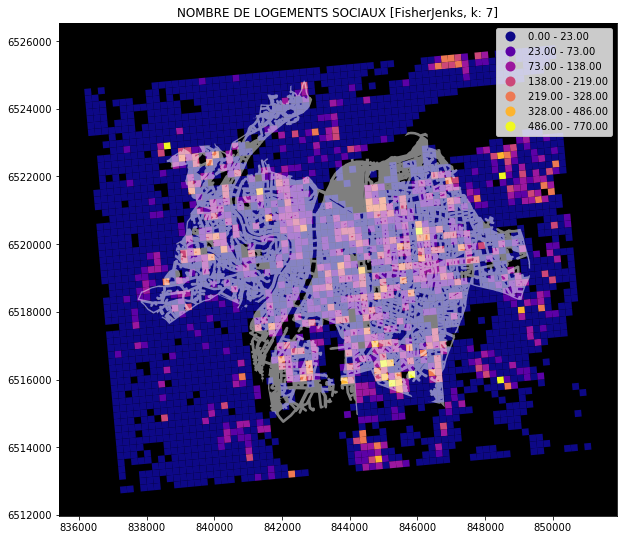

In [68]:
serie = "Log_soc"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

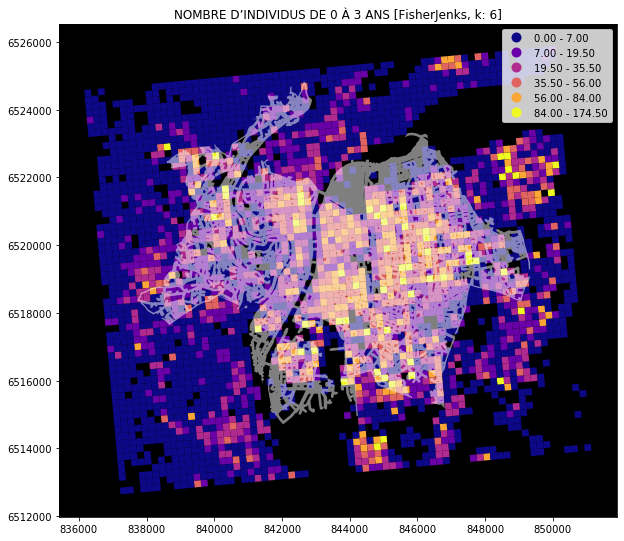

In [69]:
serie = "Ind_0_3"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

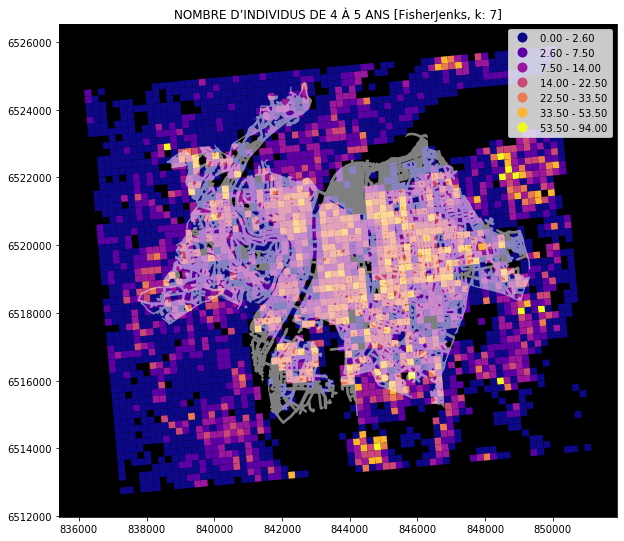

In [70]:
serie = "Ind_4_5"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

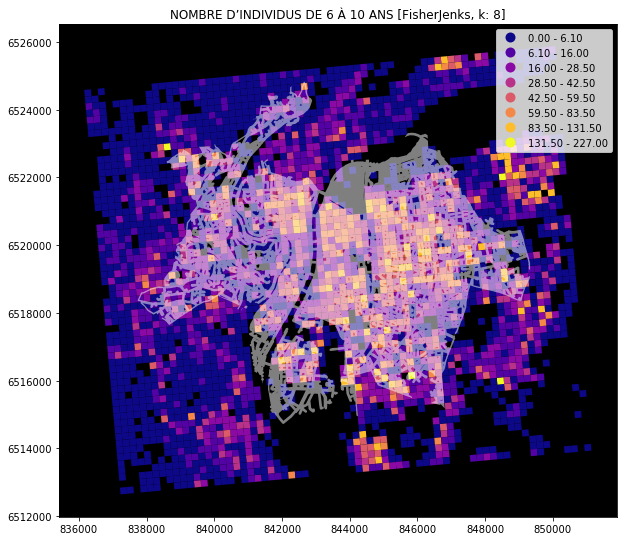

In [71]:
serie = "Ind_6_10"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

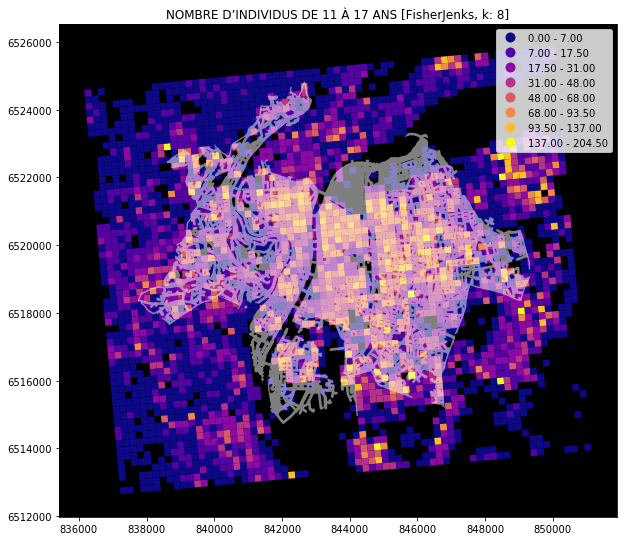

In [72]:
serie = "Ind_11_17"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

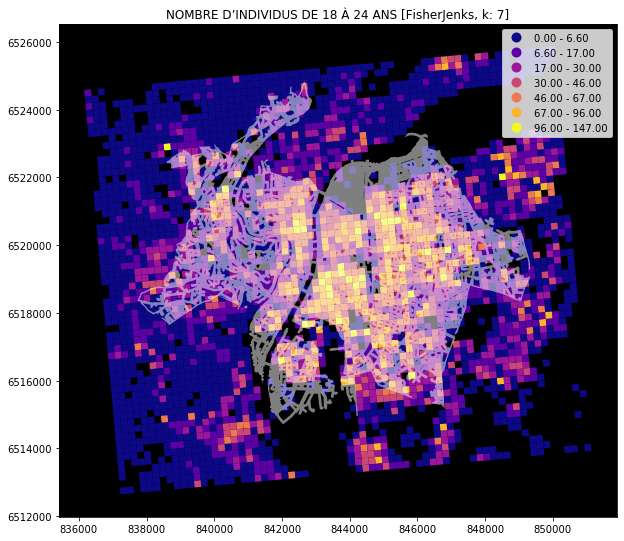

In [73]:
serie = "Ind_18_24"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

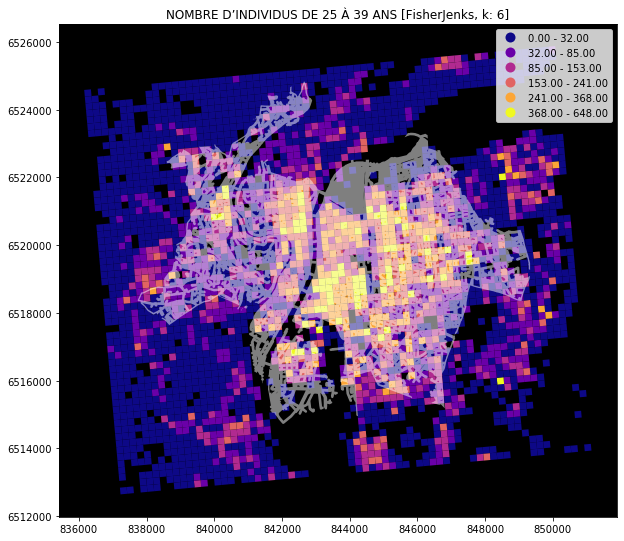

In [74]:
serie = "Ind_25_39"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

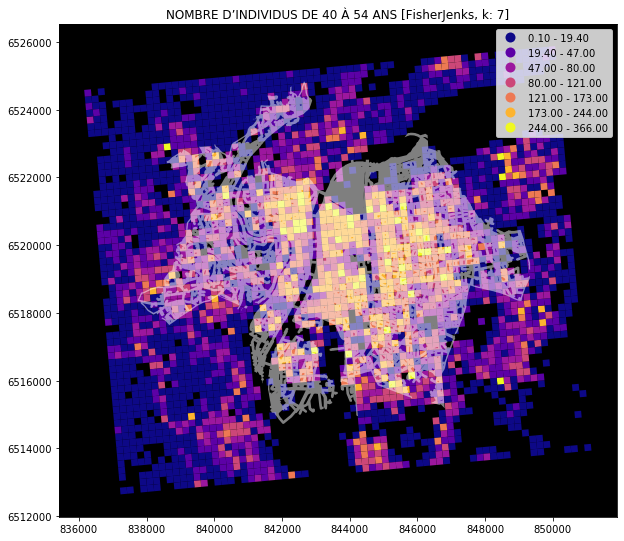

In [75]:
serie = "Ind_40_54"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

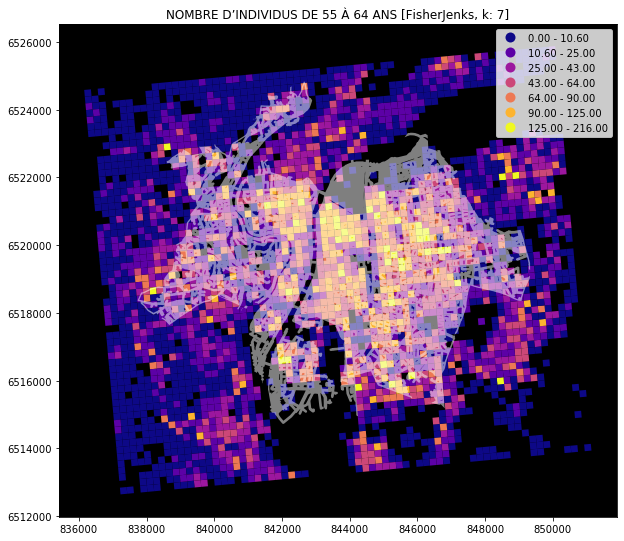

In [76]:
serie = "Ind_55_64"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

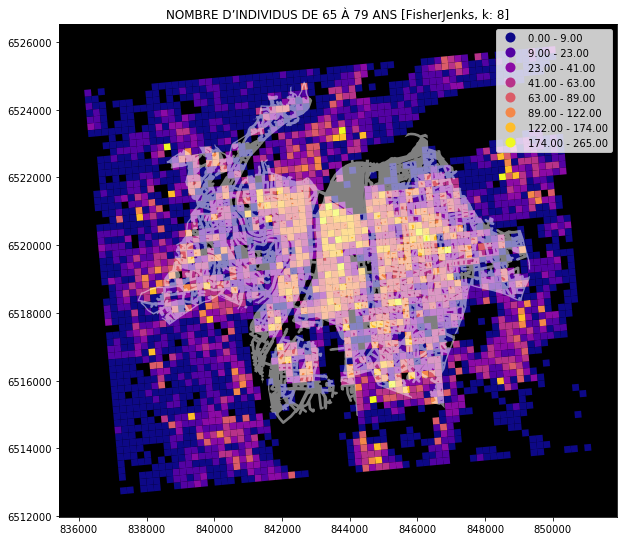

In [77]:
serie = "Ind_65_79"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)

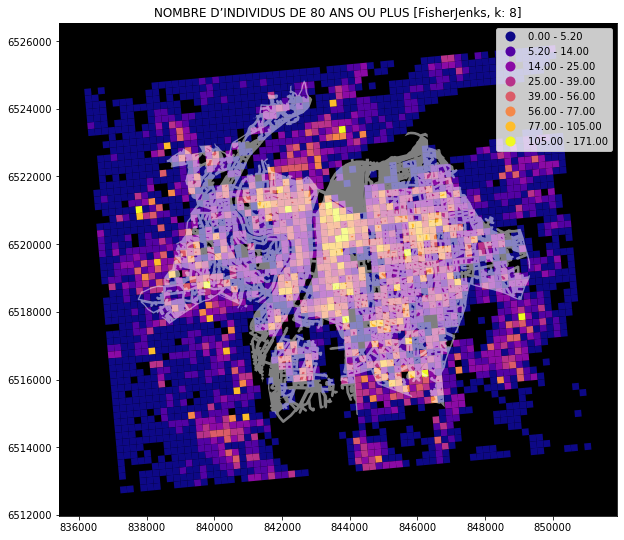

In [78]:
serie = "Ind_80p"
plot_fig(serie, height, width, cmap, major_gdf, second_gdf)